# Cityscape Image Processing
- Task 1: Enhance image quality to deal with varying lighting conditions.
- Task 2: Detect edges of vehicles and road markings to assess traffic patterns.
- Task 3: Apply filters to reduce noise and improve the clarity of moving objects

## Import Libraries

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.restoration import denoise_wavelet

from pathlib import Path

## Import and Display Images

In [18]:
data_dir = Path('cityscapes_data/train')
image_gallery = []


for img_path in data_dir.iterdir():
    if img_path.is_file() and '.jpg' in img_path.name:
        full_img = cv2.imread(img_path)
        if full_img is None:
            continue
        h,w,_ = full_img.shape
        image = full_img[:,0:(w//2)]

        image_gallery.append(image)

image_gallery = np.array(image_gallery, dtype = 'uint8')

np.random.shuffle(image_gallery)
images10 = image_gallery[:10]

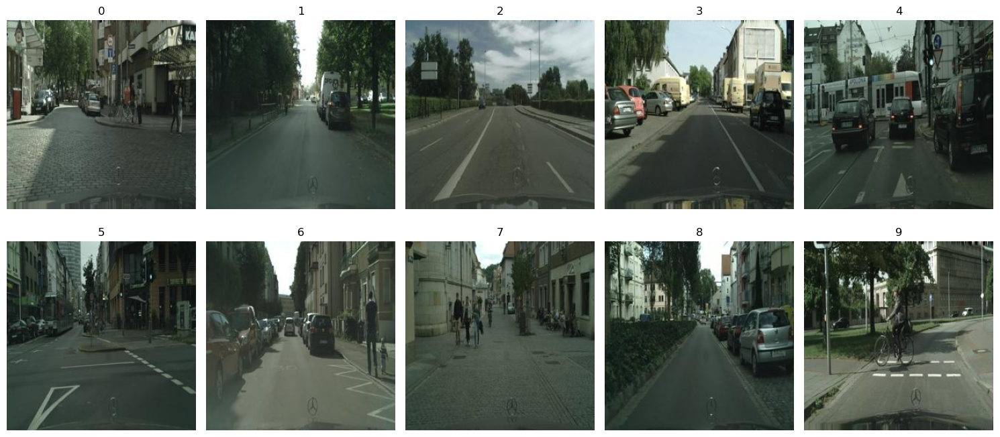

In [19]:
plt.figure(figsize=(15, 7))
for i, image in enumerate(images10):
    plt.subplot(2, 5, i+1)
    plt.imshow(cv2.cvtColor(images10[i], cv2.COLOR_BGR2RGB))
    plt.title(f'{i}')
    plt.axis('off')
plt.tight_layout()
plt.show()

## Select Image

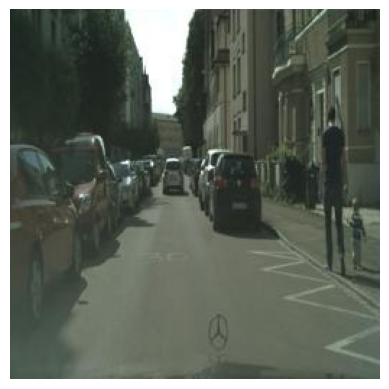

In [25]:
# Select the image number from above gallary to work with it.
SELECT_IMAGE = 6

img = images10[SELECT_IMAGE,:,:,:]
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

## Image Color Enhancement

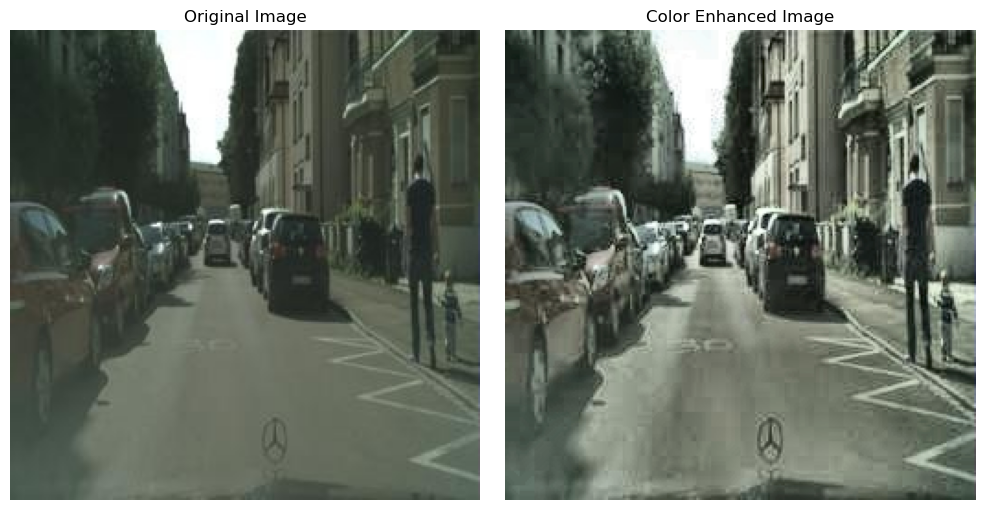

In [26]:
# CLAHE
lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab_image)
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
cl = clahe.apply(l)
merged_lab = cv2.merge((cl, a, b))
enhanced_color_image = cv2.cvtColor(merged_lab, cv2.COLOR_LAB2BGR)


titles = ['Original Image', 'Color Enhanced Image']
images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(enhanced_color_image, cv2.COLOR_BGR2RGB)]

plt.figure(figsize=(15, 5))
for i in range(len(titles)):
    plt.subplot(1, 3, i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

# Denoising

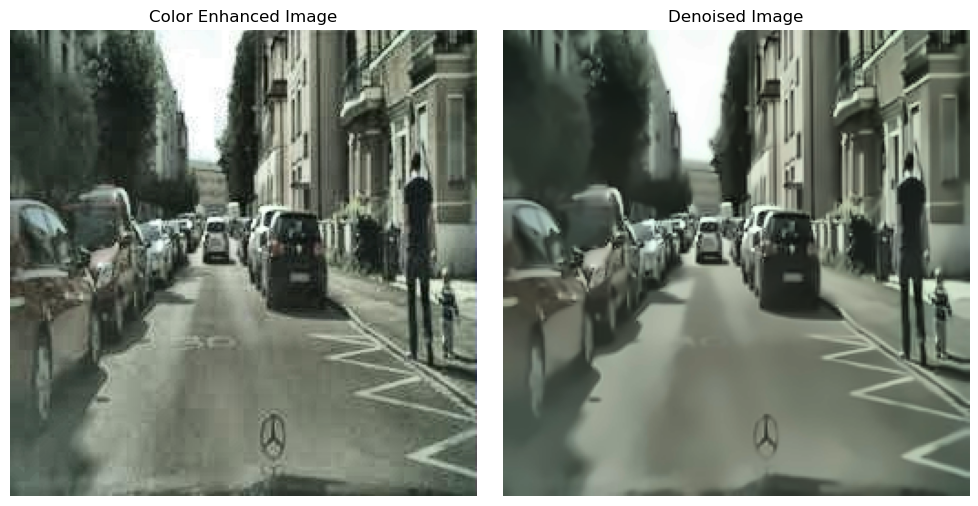

In [27]:
# guss_blur = cv2.GaussianBlur(enhanced_color_image, (3, 3), 0)
# median_blur = cv2.medianBlur(enhanced_color_image, 3)
# bilateral_blur = cv2.bilateralFilter(enhanced_color_image, d=9, sigmaColor=25, sigmaSpace=100)
# wavelet_blur = denoise_wavelet(enhanced_color_image, channel_axis=-1, rescale_sigma=True)
nonlin_blur = cv2.fastNlMeansDenoisingColored(enhanced_color_image, None, 10, 10, 5, 15)


blurred_image = nonlin_blur
titles = ['Color Enhanced Image', 'Denoised Image']
images = [cv2.cvtColor(enhanced_color_image, cv2.COLOR_BGR2RGB), cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB)]

plt.figure(figsize=(10, 5))
for i in range(len(titles)):
    plt.subplot(1, 2, i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

## Edge Detection

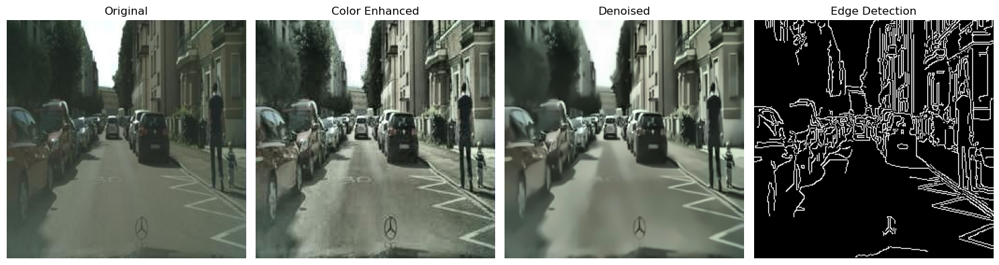

In [28]:
edges = cv2.Canny(blurred_image, 100, 200)

titles = ['Original','Color Enhanced','Denoised','Edge Detection']
images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB), cv2.cvtColor(enhanced_color_image, cv2.COLOR_BGR2RGB), 
          cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB), cv2.cvtColor(edges, cv2.COLOR_BGR2RGB)]

plt.figure(figsize=(15, 5))
for i in range(len(titles)):
    plt.subplot(1, 4, i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

## Show 10 Images with the effect

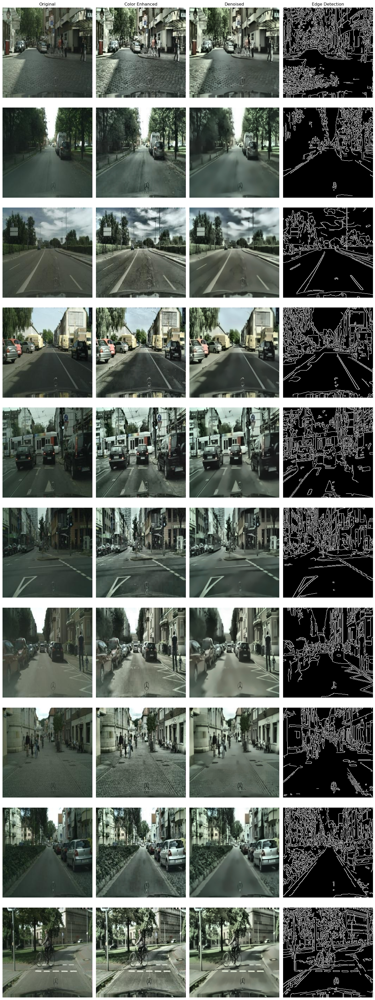

In [29]:
color_enhanced_10 = []
denoised_10 = []
edge_10 = []
for i, image in enumerate(images10):
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab_image)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    merged_lab = cv2.merge((cl, a, b))
    enhanced_color_image = cv2.cvtColor(merged_lab, cv2.COLOR_LAB2BGR)
    color_enhanced_10.append(enhanced_color_image)

    nonlin_blur = cv2.fastNlMeansDenoisingColored(enhanced_color_image, None, 10, 10, 5, 15)
    denoised_10.append(nonlin_blur)

    edges = cv2.Canny(nonlin_blur, 100, 200)
    edge_10.append(edges)





titles = ['Original', 'Color Enhanced', 'Denoised', 'Edge Detection']
plt.figure(figsize=(15, 40))  # Adjust figure size for better visibility

for row in range(10):  # Loop over each set of images in the arrays
    images = [
        cv2.cvtColor(images10[row], cv2.COLOR_BGR2RGB),
        cv2.cvtColor(color_enhanced_10[row], cv2.COLOR_BGR2RGB),
        cv2.cvtColor(denoised_10[row], cv2.COLOR_BGR2RGB),
        cv2.cvtColor(edge_10[row], cv2.COLOR_BGR2RGB)
    ]
    
    for col in range(4):  # Loop over each column per row
        plt.subplot(10, 4, row * 4 + col + 1)
        plt.imshow(images[col])
        if row == 0:  # Only add titles on the first row
            plt.title(titles[col])
        plt.axis('off')

plt.tight_layout()
plt.show()
